# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [1]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt
import math

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [2]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(-1.0380)


## Sampling from categorical probabilities with given probabilities

In [3]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(1)


## Animating data

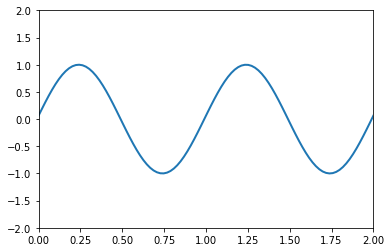

In [4]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 100)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init, frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

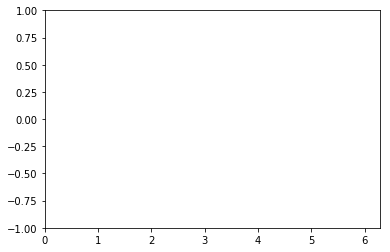

In [5]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = plt.plot([], [], 'ro', animated=True)

def init():
    ax.set_xlim(0, 2*np.pi)
    ax.set_ylim(-1, 1)
    return ln,

def update(frame):
    xdata.append(frame)
    ydata.append(np.sin(frame))
    ln.set_data(xdata, ydata)
    return ln,

ani = animation.FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 128),
                    init_func=init, blit=True)
plt.show()
HTML(ani.to_jshtml())

## Drawing histogram

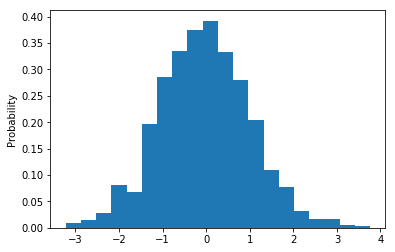

In [6]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=20)
plt.ylabel('Probability');

## Task 1

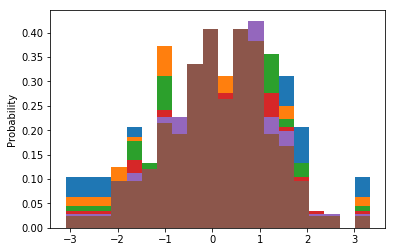

In [7]:
# mu, sigma = 0, 0.1 # mean and standard deviation
x = np.random.normal(size = 30)
plt.hist(x, density=True, bins=20)
plt.ylabel('Probability')

for i in range(5):
    x = np.append(x, np.random.normal(size=20))
    plt.hist(x, density=True, bins=20)
#     plt.show()
    
    
# count, bins, ignored = plt.hist(x, density=True, bins=20)
# plt.plot(bins, 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (bins - mu)**2 / (2 * sigma**2) ), linewidth=2, color='r')
# plt.show()

UnboundLocalError: local variable 'x' referenced before assignment

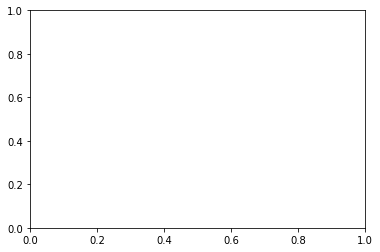

In [8]:
# x = np.random.normal(0, 0.7, 1000)
fig, ax = plt.subplots()

def update(frame):
    if frame <=2: 
        x = []
        return
    ax.clear()
    x = np.append(x, np.random.normal(size = 20))
    print(x.shape)
    ax.hist(x, density=True, bins=np.linspace(-2, 2, num=30), alpha=0.5)
    ax.set_ylim(0, 1)

simulation = animation.FuncAnimation(fig, update, frames=100, repeat=False)
HTML(simulation.to_jshtml())

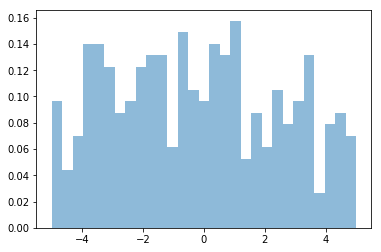

In [29]:
mean, variance = 0, 5

def generate_numbers(mean, var, size):
    x = []
    for i in range(size):
        x.append(pyro.sample("normal_sampling", pyro.distributions.Normal(mean, var)))
    return x
        
x = generate_numbers(mean, variance, 1000)
fig, ax = plt.subplots()

def update(frame):
    if frame <=2: 
        return
    ax.clear()
    ax.hist(x[:frame], density=True, bins=np.linspace(-5, 5, num=30), alpha=0.5)
#     ax.set_ylim(0, 1)

simulation = animation.FuncAnimation(fig, update, frames=500, repeat=False)
HTML(simulation.to_jshtml())

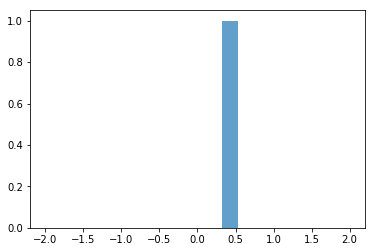

In [28]:
size = 10000
x = np.random.normal(0, 0.7, size-1)
fig, ax = plt.subplots()

def update(frame):
#     if frame <=2: 
#         return
    ax.clear()
    ax.hist(x[:int(frame*frame/2) + 1], density=False, bins=np.linspace(-2, 2, num=20), alpha=0.7)
#     ax.set_ylim(0, 1)

simulation = animation.FuncAnimation(fig, update, frames=100, repeat=False)
HTML(simulation.to_jshtml())

UnboundLocalError: local variable 'x' referenced before assignment

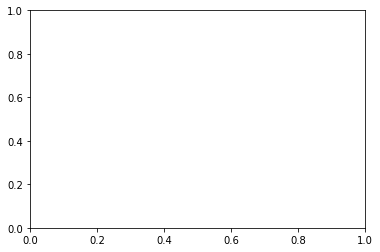

In [24]:
# x = np.random.normal(0, 0.7, 10000)
fig, ax = plt.subplots()

def init():
    x = np.random.normal(0, 0.7, 10)
    return x,

def update(frame):
    if frame <=2: 
        return
    ax.clear()
    x = np.append(x, np.random.normal(0, 0.7, 10))
    ax.hist(x, density=False, bins=np.linspace(-2, 2, num=20), alpha=0.7)
#     ax.set_ylim(0, 1)
    return x,

simulation = animation.FuncAnimation(fig, update, init_func=init, repeat=False)
HTML(simulation.to_jshtml())

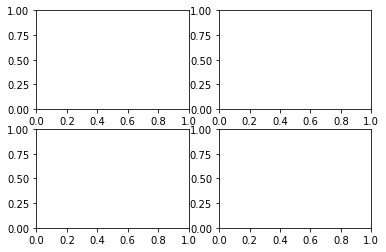

In [13]:
# generate 4 random variables from the random, gamma, exponential, and uniform distribution
x1 = np.random.normal(0, 0.7, 1000)
# x2 = np.random.gamma(2, 1.5, 10000)
# x3 = np.random.exponential(2, 10000)+7
# x4 = np.random.uniform(14,20, 10000)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

def updateData(curr):
    if curr <=2: return
    for ax in (ax1, ax2, ax3, ax4):
        ax.clear()
    ax1.hist(x1[:curr], density=True, bins=np.linspace(-2, 2, num=50), alpha=0.5)
#     ax1.set_ylim(0, 1)

#     ax2.hist(x2[:curr], normed=True, bins=np.linspace(0,15,num=21), alpha=0.5)
#     ax3.hist(x3[:curr], normed=True, bins=np.linspace(7,20,num=21), alpha=0.5)
#     ax4.hist(x4[:curr], normed=True, bins=np.linspace(14,20,num=21), alpha=0.5)

simulation = animation.FuncAnimation(fig, updateData, interval=50, repeat=False)

plt.show()

HTML(simulation.to_jshtml())

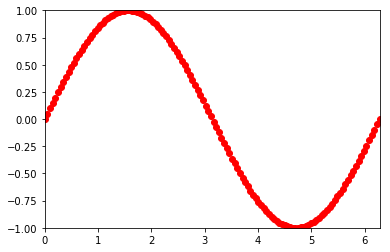

In [12]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = plt.plot([], [], 'ro', animated=True)

def init():
    ax.set_xlim(0, 2*np.pi)
    ax.set_ylim(-1, 1)
    return ln,

def update(frame):
    xdata.append(frame)
    ydata.append(np.sin(frame))
    ln.set_data(xdata, ydata)
    return ln,

ani = animation.FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 128), init_func=init, blit=True)
HTML(ani.to_jshtml())

## Task 2

In [14]:
## Insert solution here